## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration & Distortion Correction

In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    # Draw and display the corners for the 12th image as an example
    if i == 11 and ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        rgb_im = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imsave('./examples/calibration_example.png', rgb_im)

In [3]:
# Get shapes of image axes
image = cv2.imread('./examples/calibration_example.png')
img_size = (image.shape[1], image.shape[0])

# Using the objpoints and imgpoints, carry out camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

In [6]:
import pickle

# Save mtx and dist variables
with open('var.pkl', 'wb') as f:
    pickle.dump([mtx, dist], f)

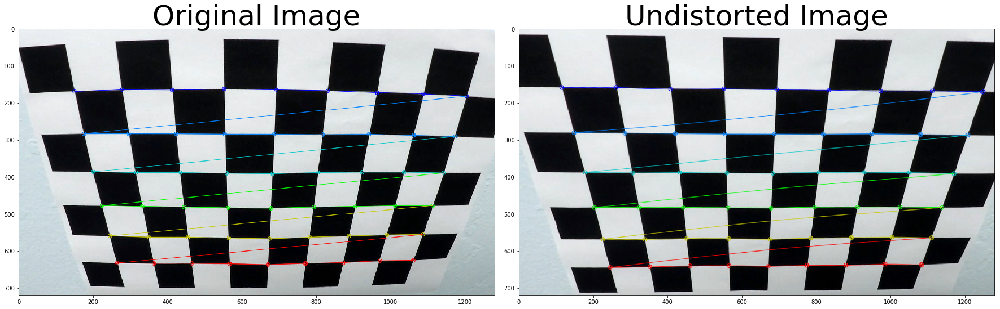

In [4]:
# Using matrix and distortion coefficient values 
# correct distortion for the test image
undist = cv2.undistort(image, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Distortion Correction

In [2]:
def undistort (path):
    """
    Undistorts an image using matrix and distortion coefficient.
    
    Arguments:
    path:path to the image file to be distorted
    
    """
    # Get mtx and dist variables
    with open('var.pkl', 'rb') as f:
        mtx, dist = pickle.load(f)
        
    # Read in image
    image = cv2.imread(path)
    
    # Correct distortion with given values
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    return undist

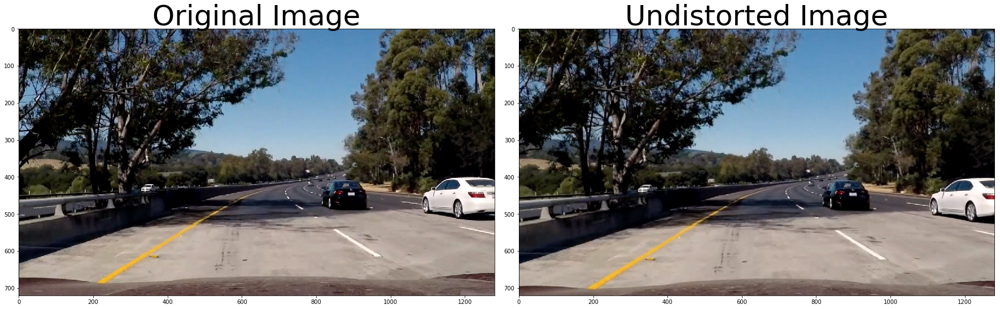

In [11]:
# Save an example of distortion correction for one test image
img_path = './test_images/test5.jpg'

image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

undist = undistort(img_path)
undist_rgb = cv2.cvtColor(undist,cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist_rgb)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.imsave('./examples/undistort_test_image.png', undist_rgb)

### Color & Gradient Threshold

Here I defined functions to apply gradient and color thresholds, and experimented with different filter and threshold combinations.

In [3]:
# Define functions for sobel filter application

# Absolute sobel filter in x or y direction
def abs_sobel_thresh(image, orient, sobel_kernel, thresh):
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Calculate the gradience according to orient x or y
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    
    # Rescale to 8 bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a binary image according to thresholds
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return grad_binary

# Sobel filter with gradient magnitude thresholding
def mag_thresh(image, sobel_kernel, mag_thresh):
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image according to thresholds
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return mag_binary

# Sobel filter with gradient direction thresholding
def dir_threshold(image, sobel_kernel, thresh=(0, np.pi/2)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Get the gradient direction
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image according to thresholds
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return dir_binary

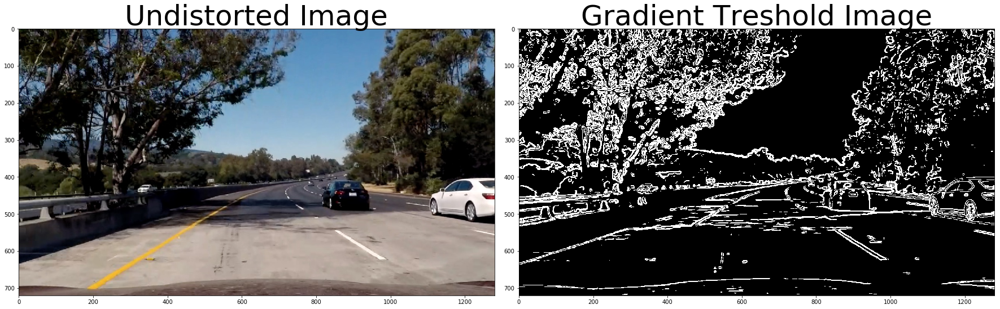

In [3]:
# Choose kernel size
ksize = 9

image = cv2.imread('./examples/undistort_test_image.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image_rgb, orient='x', sobel_kernel=ksize, thresh=(20,100))
grady = abs_sobel_thresh(image_rgb, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(image_rgb, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image_rgb, sobel_kernel=ksize, thresh=(0, np.pi/2))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Gradient Treshold Image', fontsize=50)
plt.imsave('./examples/grad_threshold.png', combined)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

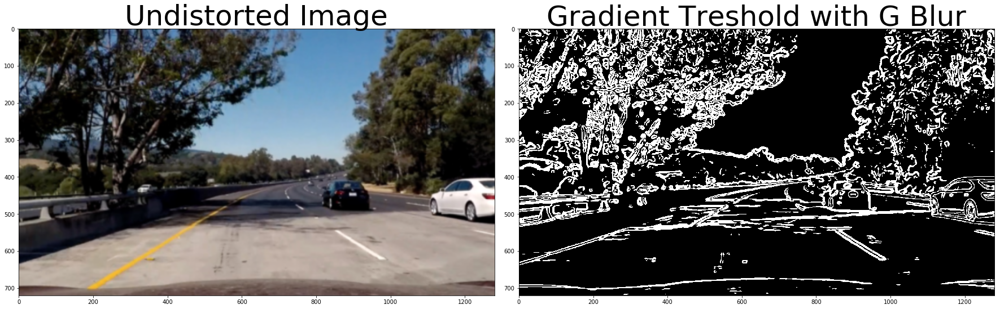

In [4]:
# Add Gaussian blur for smoothing
image_rgb = cv2.GaussianBlur(image_rgb, (ksize, ksize), 0)

# Apply each of the thresholding functions
gradx2 = abs_sobel_thresh(image_rgb, orient='x', sobel_kernel=ksize, thresh=(20,100))
grady2 = abs_sobel_thresh(image_rgb, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary2 = mag_thresh(image_rgb, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary2 = dir_threshold(image_rgb, sobel_kernel=ksize, thresh=(0, np.pi/2))

combined2 = np.zeros_like(dir_binary2)
combined2[((gradx2 == 1) & (grady2 == 1)) | ((mag_binary2 == 1) & (dir_binary2 == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('Gradient Treshold with G Blur', fontsize=50)
plt.imsave('./examples/grad_threshold_gblur.png', combined2)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [5]:
# Function for HLS thresholding
def hls_thresh(image, channel_nr= 2, thresh = (180, 255)):
    # Conver to HLS channel space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    
    channel = hls[:,:,channel_nr]
    
    hls_binary = np.zeros_like(channel)
    hls_binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    
    return hls_binary

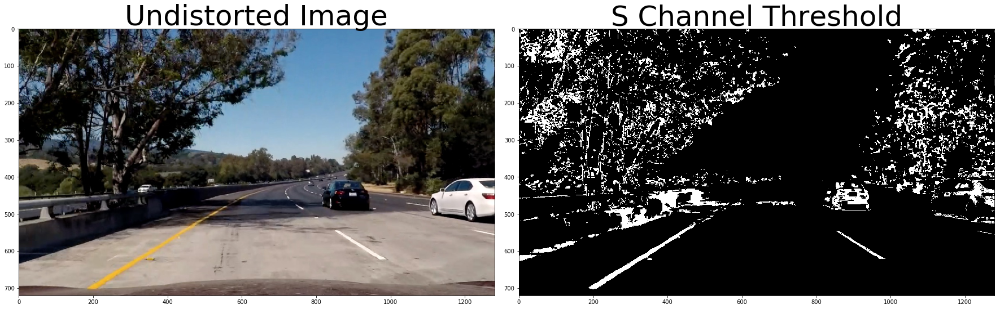

In [7]:
# Display S Channel threshold result

image = cv2.imread('./examples/undistort_test_image.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

color_th = hls_thresh(image, thresh= (140, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(color_th, cmap='gray')
ax2.set_title('S Channel Threshold', fontsize=50)
plt.imsave('./examples/color_threshold.png', color_th)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

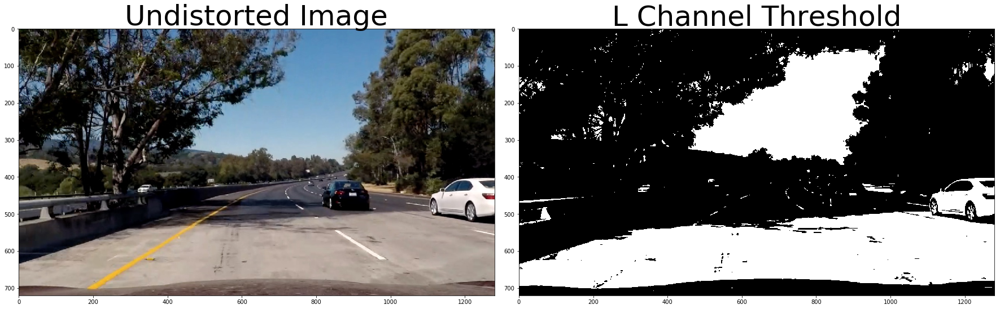

In [8]:
# Display L Channel threshold result

image = cv2.imread('./examples/undistort_test_image.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

color_th = hls_thresh(image, channel_nr= 1, thresh= (140, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(color_th, cmap='gray')
ax2.set_title('L Channel Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

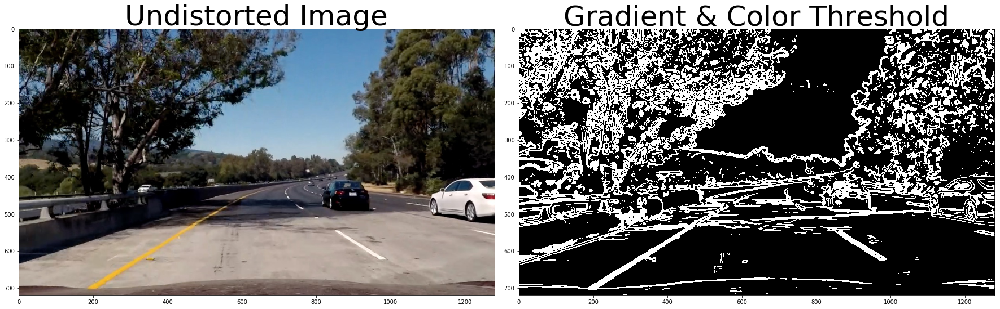

In [18]:
ksize = 9

undist = undistort('./test_images/test5.jpg')
image_rgb = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)

# Add Gaussian blur for smoothing
image_copy = cv2.GaussianBlur(image_rgb, (ksize, ksize), 0)

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image_copy, orient='x', sobel_kernel=ksize, thresh=(20,100))
grady = abs_sobel_thresh(image_copy, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(image_copy, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image_copy, sobel_kernel=ksize, thresh=(0, np.pi/2))

combined_sobel = np.zeros_like(dir_binary)
combined_sobel[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

color_th = hls_thresh(image_copy, thresh= (120, 240))

combined_binary = np.zeros_like(combined_sobel)
combined_binary[(combined_sobel == 1) | (color_th == 1)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('Gradient & Color Threshold', fontsize=50)
plt.imsave('./examples/grad_color_threshold.png', combined_binary)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

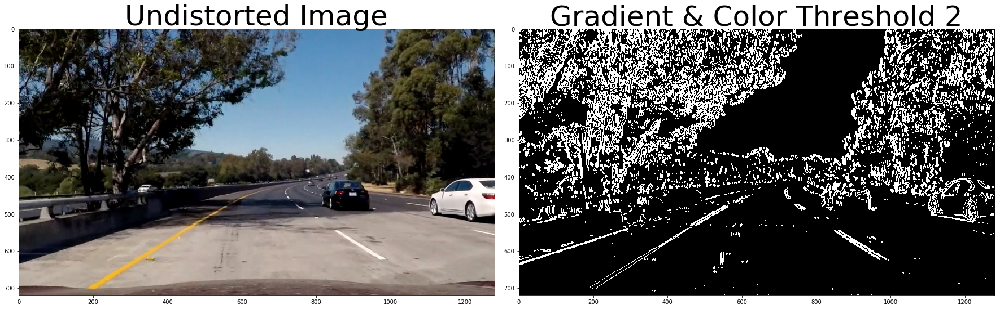

In [5]:
ksize = 9

undist = undistort('./test_images/test5.jpg')
image_rgb = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)

# Add Gaussian blur for smoothing
image_copy = cv2.GaussianBlur(image_rgb, (ksize, ksize), 0)

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image_copy, orient='x', sobel_kernel=ksize, thresh=(20,100))
#grady = abs_sobel_thresh(image_copy, orient='y', sobel_kernel=ksize, thresh=(20, 200))
#mag_binary = mag_thresh(image_copy, sobel_kernel=ksize, mag_thresh=(30, 200))
#dir_binary = dir_threshold(image_copy, sobel_kernel=ksize, thresh=(0, np.pi/2))

#combined_sobel = np.zeros_like(dir_binary)
#combined_sobel[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

color_th = hls_thresh(image_copy, thresh= (120, 240))

combined_binary = np.zeros_like(gradx)
combined_binary[(gradx == 1) | (color_th == 1)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('Gradient & Color Threshold 2', fontsize=50)
plt.imsave('./examples/grad_color_threshold2.png', combined_binary)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

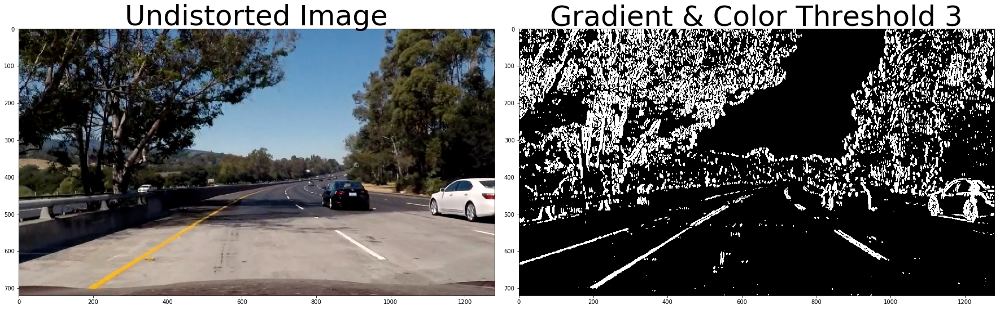

In [11]:
ksize = 9

undist = undistort('./test_images/test5.jpg')
image_rgb = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)

# Add Gaussian blur for smoothing
image_copy = cv2.GaussianBlur(image_rgb, (ksize, ksize), 0)

# Apply sobelx thresholding
gradx = abs_sobel_thresh(image_copy, orient='x', sobel_kernel=ksize, thresh=(20, 255))

# Apply color thresholding in HLS space
color_l = hls_thresh(image_copy, channel_nr= 1,thresh= (40, 255))
color_s = hls_thresh(image_copy, channel_nr= 2, thresh= (170, 255))

# Combine binary images from threshold output
combined_binary = np.zeros_like(gradx)
combined_binary[((color_l == 1) & (color_s == 1) | (gradx == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_rgb)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('Gradient & Color Threshold 3', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective Transformation

In [2]:
image = cv2.imread('./test_images/test5.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [3]:
img_shape = (image_rgb.shape[0], image_rgb.shape[1])
img_shape

(1280, 720)

In [30]:
# Identify coordinates for best fitting polygon
src = np.float32([[580, 450],
                     [180, 720],
                     [1120, 720],
                     [700, 450]])

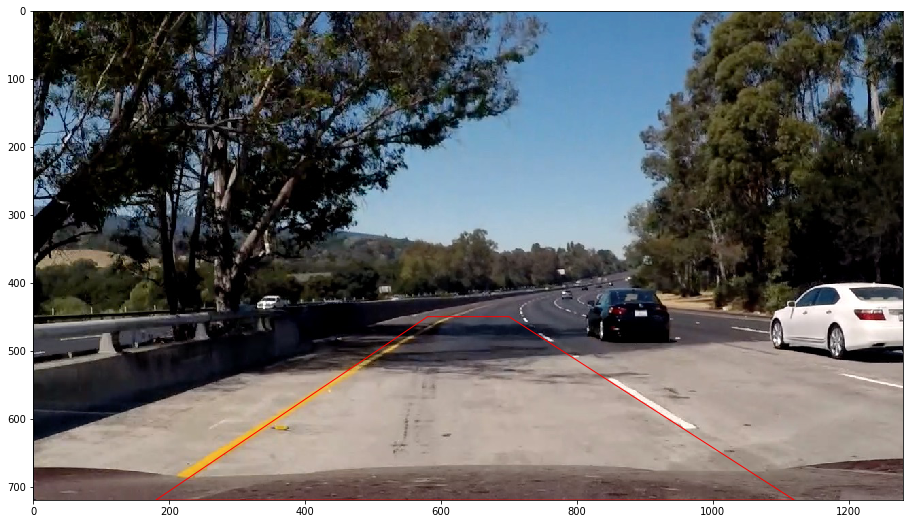

In [31]:
from matplotlib.patches import Polygon

f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
ax1.imshow(image_rgb)

# Create a Rectangle patch
polygon_src = Polygon(src, color='r', fill=False)

ax1.add_patch(polygon_src)

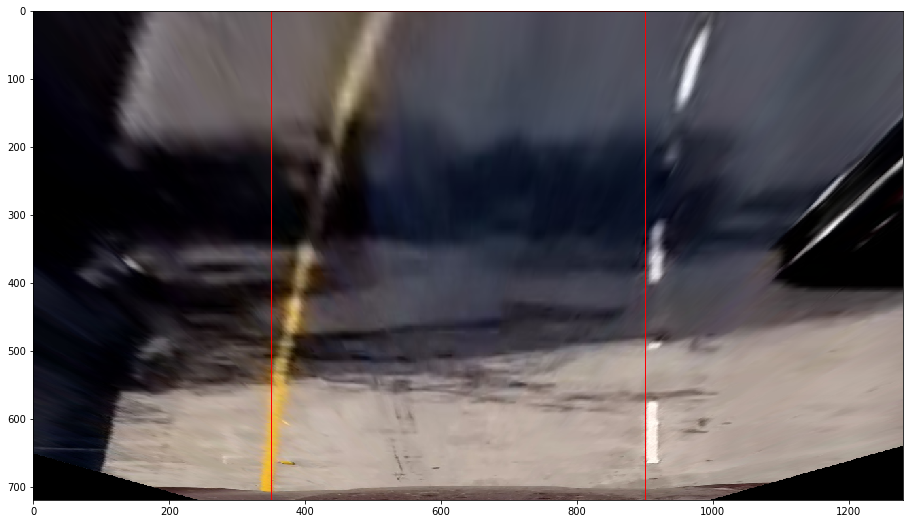

In [32]:
dst = np.float32([[350, 0],
                     [350, 720],
                     [900, 720],
                     [900, 0]])

M = cv2.getPerspectiveTransform(src, dst)

warped = cv2.warpPerspective(image_rgb, M, (img_shape[1], img_shape[0]), flags=cv2.INTER_LINEAR)

f, ax2 = plt.subplots(1, 1, figsize=(24, 9))
ax2.imshow(warped)


polygon_dst = Polygon(dst, color='r', fill=False)
ax2.add_patch(polygon_dst)

In [6]:
binary = cv2.imread('./examples/grad_color_threshold2.png')
binary = cv2.cvtColor(binary, cv2.COLOR_BGR2GRAY)
img_shape = (binary.shape[0], binary.shape[1])
img_shape

(720, 1280)

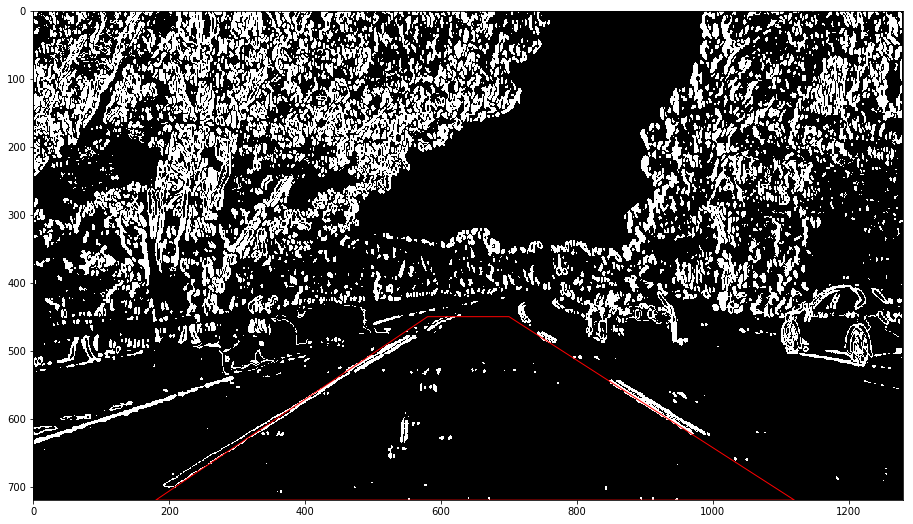

In [21]:
from matplotlib.patches import Polygon

# Identify coordinates for best fitting polygon
src = np.float32([[580, 450],
                     [180, 720],
                     [1120, 720],
                     [700, 450]])

f, ax = plt.subplots(1, 1, figsize=(24, 9))
ax.imshow(combined_binary, cmap='gray')

# Create a Rectangle patch
polygon_src = Polygon(src, color='r', fill=False)

ax.add_patch(polygon_src)


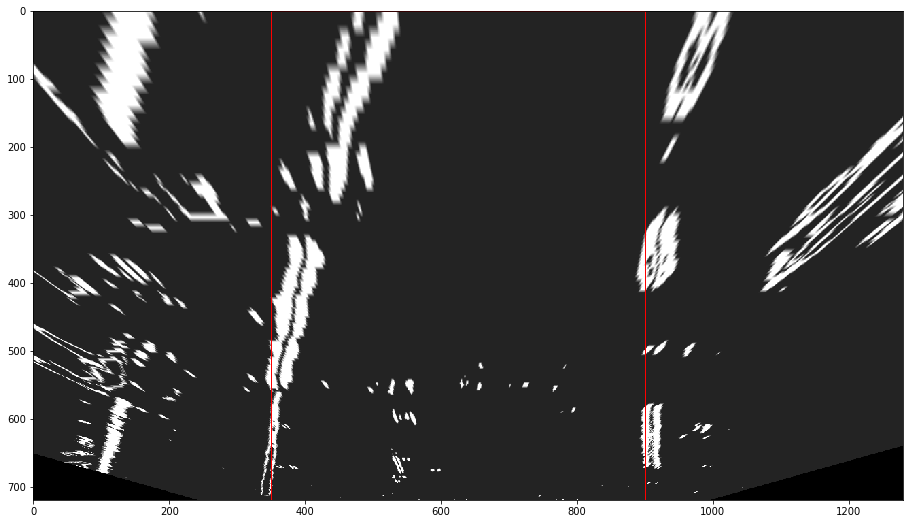

In [22]:
dst = np.float32([[350, 0],
                     [350, 720],
                     [900, 720],
                     [900, 0]])

M = cv2.getPerspectiveTransform(src, dst)

warped_b = cv2.warpPerspective(combined_binary, M, (img_shape[1], img_shape[0]), flags=cv2.INTER_LINEAR)

f, ax2 = plt.subplots(1, 1, figsize=(24, 9))
ax2.imshow(warped_b, cmap='gray')


polygon_dst = Polygon(dst, color='r', fill=False)
ax2.add_patch(polygon_dst)

In [9]:
plt.imsave('./examples/persp_transform2.png', warped_b)

### Finding Lane Lines

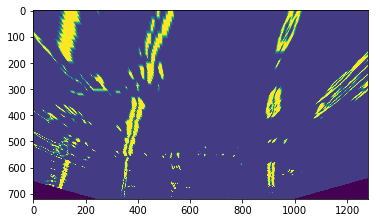

In [30]:
# Create histogram for warped image
binary_warped= cv2.imread('./examples/persp_transform2.png', cv2.IMREAD_UNCHANGED)
plt.imshow(binary_warped)

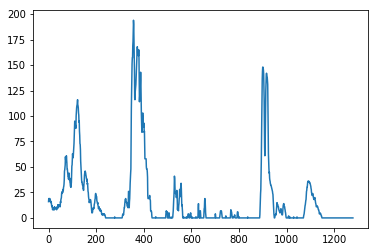

In [23]:
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [26]:
# Below Code is copied from Udacity part 34 of Advanced Techniques for Lane Finding Lesson

# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]//nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

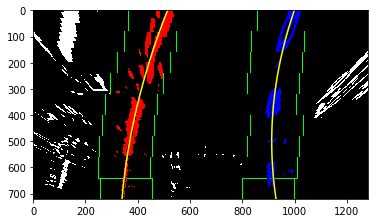

In [27]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Putting The Pipeline Together

In [1]:
import cv2
import sys
import pickle
from collections import deque
import numpy as np
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
%matplotlib inline

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        #queue size
        self.iterations = 5
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = deque([], 5)
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = deque([], 5)
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #x values for detected line pixels
        self.allx = None
        
    def add_line(self, fitx, polyfit, radius):
        """ 
        Takes fitted X indices, coefficients
        and radius of curvature for a detected line.
        Evaluates given arguments and updates the line
        object properties accordingly.
        """
        # Add line fit if there no currently identified fits.
        if not self.current_fit:
            self.recent_xfitted.append(fitx)
            self.bestx = np.average(self.recent_xfitted, axis=0)
            self.current_fit.append(polyfit)
            self.best_fit = polyfit
            self.radius_of_curvature = radius
            self.allx = fitx
            self.detected = True
        
        # Compare top and bottom x indice values and polynomial coefficients 
        # between the current fit and averaged values over n previous iterations 
        elif ((abs(fitx[-1] - self.bestx[-1]) < 20 and abs(fitx[0] - self.bestx[0]) < 20) and 
        ((abs(self.best_fit[0]-polyfit[0]) <= 0.001) or 
         (abs(self.best_fit[1]-polyfit[1]) <= 1.0) or 
         (abs(self.best_fit[2]-polyfit[2]) <= 100.))):
            
            if len(self.recent_xfitted) < self.iterations:
                self.recent_xfitted.append(fitx)
            else:
                self.recent_xfitted.popleft()
                self.recent_xfitted.append(fitx)
            
            if len(self.current_fit) < self.iterations:
                self.current_fit.append(polyfit)
            else:
                self.current_fit.popleft()
                self.current_fit.append(polyfit)
            
            self.bestx = np.average(self.recent_xfitted, axis=0)
            self.best_fit = np.average(self.current_fit, axis = 0)
            self.radius_of_curvature = radius
            self.allx = fitx
            self.detected = True
        
        else:
            self.detected = False
        
        
def undistort (image):
    """
    Undistorts an image using matrix and distortion coefficient.
    
    """
    # Get mtx and dist variables
    with open('var.pkl', 'rb') as f:
        mtx, dist = pickle.load(f)

    # Correct distortion with given values
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    return undist

def abs_sobel_thresh(image_gray, orient, sobel_kernel, thresh):
    """
    Returns a binary image created by applying absolute
    sobel thresholding with given orientation and thresholds
    to a gray scale image.
    
    """
    
    # Calculate the gradience according to orient x or y
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 0, 1))
    
    # Rescale to 8 bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a binary image according to thresholds
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return grad_binary

def mag_threshold(image_gray, sobel_kernel, mag_thresh):
    """
    Returns a binary image created by applying sobel gradient
    magnitude thresholding with given kernel and thresholds
    to a gray scale image.
    
    """
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image according to thresholds
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return mag_binary

def dir_thresh(image_gray, sobel_kernel, thresh=(0, np.pi/2)):
    """
    Returns a binary image created by applying sobel gradient
    direction thresholding with given kernel and thresholds
    to a gray scale image.
    
    """
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Get the gradient direction
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image according to thresholds
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return dir_binary

def hls_thresh(image_rgb, channel_nr= 2, thresh = (90, 255)):
    """
    Takes a rgb image and returns a binary image created by applying value
    threshold on a given HLS channel.
    
    """
    
    hls = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HLS)
    
    channel = hls[:,:,channel_nr]
    
    hls_binary = np.zeros_like(channel)
    hls_binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    
    return hls_binary

def warp_p(binary_img):
    """
    Warps binary_image using hard coded source and destination
    vertices. Returns warped binary image, warp matrix and
    inverse matrix.
    
    """
    
    src = np.float32([[580, 450],
                     [180, 720],
                     [1120, 720],
                     [700, 450]])
    
    dst = np.float32([[350, 0],
                     [350, 720],
                     [900, 720],
                     [900, 0]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    Minv = cv2.getPerspectiveTransform(dst, src)

    binary_warped = cv2.warpPerspective(binary_img, M, (binary_img.shape[1], binary_img.shape[0]), flags=cv2.INTER_LINEAR)
    
    return binary_warped, M, Minv

def mask_aoi(gray_image):
    """
    Takes in a gray scale image and returns a masked version
    using predetermined x coordinate indices.
    
    """
    masked = np.copy(gray_image)
    masked[:,:250]  = 0
    masked[:,1050:] = 0
    
    return masked   

def find_lanelines(binary_warped):
    """
    Takes in a warped binary image containing birds eye view
    of lane lines. 
    
    """
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    return left_fitx, right_fitx, left_fit, right_fit

def generalize_lanelines(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) +
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit2 = np.polyfit(lefty, leftx, 2)
    right_fit2 = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
    right_fitx = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
    
    return left_fitx, right_fitx, left_fit2, right_fit2

def calc_radius(image, left_ind, right_ind):
    """
    Calculates radius for given left and right lane indices.
    
    """
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define position of the car as center of the image
    car_pos = (image.shape[1]/2) * xm_per_pix
    
    # Fit new polynomials to x,y in world space
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_ind*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_ind*xm_per_pix, 2)
    
    # Calculate x intercepts for left and right polynomials in world space
    left_intercept = left_fit_cr[0]*(image.shape[0]*ym_per_pix)**2 + left_fit_cr[1]*(image.shape[0]*ym_per_pix) + left_fit_cr[2]
    right_intercept = right_fit_cr[0]*(image.shape[0]*ym_per_pix)**2 + right_fit_cr[1]*(image.shape[0]*ym_per_pix) + right_fit_cr[2]
    
    # Calculate the new radii of curvature and car position as offset from mid lane
    y_eval = np.max(ploty)
    left_radi = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5)/np.absolute(2*left_fit_cr[0])
    right_radi = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix +right_fit_cr[1])**2)**1.5)/np.absolute(2*right_fit_cr[0])
    offset = (car_pos - ((left_intercept + right_intercept)/2))  
    
    return left_radi, right_radi, offset

def draw_lanelines(image, warped_image, left_fitx, right_fitx, Minv, left_radi, right_radi, offset):
    """
    Draws lane as a filled polygon and imprints calculated radius values for lane lines,
    and car center offset from the lane center.
    
    """
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped_image.shape[1], warped_image.shape[0])) 
    # Combine the result with the original image
    output = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
              
    if offset >= 0:
        message = '{:.2f} m right of center'.format(offset)
    else:
        message = '{:.2f} m left of center'.format(-offset)
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(left_radi), (50, 50), font, 1, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(right_radi), (50, 120), font, 1, fontColor, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, 1, fontColor, 2)
    
    return output

def fit_check(left_fitx, right_fitx, left_fit, right_fit,left_radi, right_radi):
    """
    Implements sanity checks for lane line polynomial fit coefficients,
    indices and radius values. Returns True if all checks are passed.
    
    """
    # Check detected lines have similar curvature
    if abs(left_radi - right_radi) > 150:
        return False
    # Check detected lines are right distance from each other
    if ((abs(left_fitx[0]-right_fitx[0]) < 400) or (abs(left_fitx[0]-right_fitx[0]) > 500)):
        return False
    
    if ((abs(left_fitx[-1]-right_fitx[-1]) < 500) or (abs(left_fitx[-1]-right_fitx[-1]) > 650)):
        return False
    # Check if line distance at the bottom is less than the top
    if (abs(left_fitx[-1]-right_fitx[-1]) < abs(left_fitx[0]-right_fitx[0])):
        return False
    
    # Calculate line slopes for min x value
    l_slope = 2*left_fit[0]*np.amin(left_fitx) + left_fit[1]
    r_slope = 2*right_fit[0]*np.amin(right_fitx) + right_fit[1]
    
    # Check if slopes are similar in value and orientation
    if ((abs(abs(l_slope) - abs(r_slope)) > .1) and 
        ((l_slope * r_slope) < 0.)):
        return False
    
    return True
    
              
def process_img(img):
    """
    Image processing pipeline for identifying road lane.
    
    """

    ksize = 9 
    
    img_cpy = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    undist = undistort(img_cpy)
    undist_gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
              
    # Add Gaussian blur for smoothing
    undist_gray = cv2.GaussianBlur(undist_gray, (ksize, ksize), 0)

    # Apply sobelx thresholding
    gradx = abs_sobel_thresh(undist_gray, orient='x', sobel_kernel=ksize, thresh=(20, 255))

    # Apply color thresholding in HLS space
    color_l = hls_thresh(img_cpy, channel_nr= 1,thresh= (40, 255))
    color_s = hls_thresh(img_cpy, channel_nr= 2, thresh= (170, 255))

    # Combine binary images from threshold output
    combined_binary = np.zeros_like(gradx)
    combined_binary[((color_l == 1) & (color_s == 1) | (gradx == 1))] = 1

    binary_warped, _, Minv = warp_p(combined_binary)
    
    binary_warped = mask_aoi(binary_warped)        
    
    if r_line.detected and l_line.detected:
        
        left_fitx, right_fitx, left_fit, right_fit = generalize_lanelines(binary_warped, 
                                                                          l_line.current_fit[-1], 
                                                                          r_line.current_fit[-1])
        
        left_radi, right_radi, offset = calc_radius(undist_gray, left_fitx, right_fitx)
        
        if fit_check(left_fitx, right_fitx, left_fit, right_fit,left_radi, right_radi):
        
            l_line.add_line(left_fitx, left_fit, left_radi)
            r_line.add_line(right_fitx, right_fit, right_radi)
            
            return draw_lanelines(img, binary_warped, l_line.bestx, r_line.bestx, Minv, 
                                  l_line.radius_of_curvature, r_line.radius_of_curvature, offset)
        else:
            l_line.detected = False
            r_line.detected = False
            l_line.recent_xfitted.clear()
            l_line.current_fit.clear()
            r_line.recent_xfitted.clear()
            r_line.current_fit.clear()
            
    if not r_line.detected or not l_line.detected:
        left_fitx, right_fitx, left_fit, right_fit = find_lanelines(binary_warped)
        
        left_radi, right_radi, offset = calc_radius(undist_gray, left_fitx, right_fitx)
        
        l_line.add_line(left_fitx, left_fit, left_radi)
        r_line.add_line(right_fitx, right_fit, right_radi)
        
        return draw_lanelines(img, binary_warped, l_line.bestx, r_line.bestx, Minv, 
                                  l_line.radius_of_curvature, r_line.radius_of_curvature, offset)

### Image Test

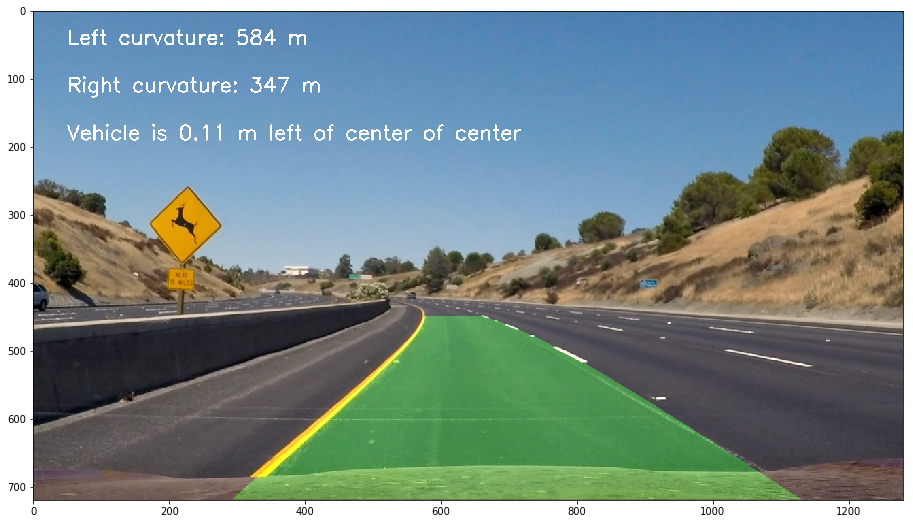

In [2]:
r_line = Line()
l_line = Line()

image = cv2.imread('./test_images/test2.jpg')

output = process_img(image)
rgb_cpy= cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

f, ax = plt.subplots(1, 1, figsize=(24, 9))
ax.imshow(rgb_cpy)

In [2]:
r_line = Line()
l_line = Line()

def video_pipeline(input_vid, output_vid):
    
    clip = VideoFileClip(input_vid)
    
    processor = clip.fl_image(process_img)
    processor.write_videofile(output_vid, audio=False)
    
    processor.reader.close()

In [3]:
video_pipeline('harder_challenge_video.mp4', 'output_video/harder_challenge_output.mp4')

[MoviePy] >>>> Building video output_video/harder_challenge_output.mp4
[MoviePy] Writing video output_video/harder_challenge_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [06:26<00:00,  3.21it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video/harder_challenge_output.mp4 

